## Load Data

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
import psycopg2

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
import json

with open('./amazon2/config.json') as f:
    config = json.load(f)  # returns a dictionary

In [5]:
conn = psycopg2.connect(**config)
# similar to psycopg2.connect(host="localhost",database="db", user="postgres", password="postgres")
conn

<connection object at 0x10f609e60; dsn: 'user=Spugnam505 password=xxx dbname=amazon host=rds-postgresql-amazon-project.cf3p5w6brrlj.us-east-2.rds.amazonaws.com port=5432', closed: 0>

In [6]:
products = pd.read_sql('select * from products;', con=conn)

In [7]:
reviews = pd.read_sql('select * from reviews;', con=conn)

## Visualization

In [8]:
products.head()
reviews.head()

,category,company,asin,rating,num_review,product_desc
0,Modems,Motorola,B00M9F4WXA,4.3,104,Motorola SURFboard SB6182 DOCSIS 3.0 Cable Modem
1,Modems,Motorola,B007P6ZLM4,3.7,94,Motorola NVG510 modem for AT&T U-Verse DSL
2,Modems,TP-Link,B01N0HF86W,4.7,7,TP-Link DOCSIS 3.0 (8x4) High Speed Cable Mode...
3,Modems,CISNO,B01E599RW8,5.0,1,New USB 2.0 56K V.92/V.90 External Voice Fax D...
4,Modems,USRobotics,B003U9ZH7Y,4.3,30,USRobotics USR5686G 56K Serial Controller Faxm...


,review_id,asin,review_date,review_rating,review_title,review_body
0,R2BDPVL433DAZR,B076CWF9WB,2017-10-10,5,versatile headphones!,great fit and awesome sound. are not very loud...
1,R3QWGZW7KXBK2U,B00ZV9RDKK,2016-12-09,5,Five Stars,Great product
2,R1872RVSMEDDGW,B00G4UQ6U8,2014-12-22,3,Odd noises coming from the headphones.,"There is a little bit of chattering, it sounds..."
3,R1L5N6KVOMQ0PZ,B00HTPHK5W,2016-01-12,5,These headphones are surprisingly very nice fo...,These headphones are surprisingly very nice fo...
4,R1M7S1HFMKROA6,B003EM8008,2016-11-21,2,"Quality is ""eh"" and they tangle up like crazy...",Tangle up as if they're waiting for you to tur...


In [9]:
# # of rows/ columns
products.shape
reviews.shape

(73825, 6)

(1506699, 6)

In [10]:
products_reviews = pd.merge(products, reviews, how='inner', on='asin')

In [11]:
pd.set_option("display.max_colwidth",50)
products_reviews.head(3)

,category,company,asin,rating,num_review,product_desc,review_id,review_date,review_rating,review_title,review_body
0,Modems,Motorola,B00M9F4WXA,4.3,104,Motorola SURFboard SB6182 DOCSIS 3.0 Cable Modem,R2QR9RUZVA3OIJ,2016-06-03,1,One Star,The modem failed to function properly. Once th...
1,Modems,Motorola,B00M9F4WXA,4.3,104,Motorola SURFboard SB6182 DOCSIS 3.0 Cable Modem,R18PCFMVH16NHU,2015-03-20,5,Super easy to set up!,Our Scientific Atlanta modem lasted almost 8 y...
2,Modems,Motorola,B00M9F4WXA,4.3,104,Motorola SURFboard SB6182 DOCSIS 3.0 Cable Modem,R1WSVUAAAO4LJR,2015-06-19,5,Works with Comcast!,Just wanted to confirm that it DOES work with ...


In [12]:
# Convert date
products_reviews['review_date'] = pd.to_datetime(products_reviews['review_date'])

In [13]:
# Describe column types
products_reviews.dtypes

category                 object
company                  object
asin                     object
rating                  float64
num_review                int64
product_desc             object
review_id                object
review_date      datetime64[ns]
review_rating             int64
review_title             object
review_body              object
dtype: object

### Null values analysis

In [14]:
np.count_nonzero(products_reviews.isnull().values)
products_reviews[products_reviews.isnull().values]

# Conclusion: 1 products without description
# Bug in the website because one has detailed reviews but no description/ picture
# also a single review without title

11

,category,company,asin,rating,num_review,product_desc,review_id,review_date,review_rating,review_title,review_body
303156,Network Transceivers,,B00008NV11,4.4,74,None,R13699Y1MXQ6NZ,2015-02-25,5,"Nice design, and no complications",Exactly what I needed. A cost effective Fiber...
303157,Network Transceivers,,B00008NV11,4.4,74,None,R2BTP5N1RCDA94,2016-07-31,5,Five Stars,Good
303158,Network Transceivers,,B00008NV11,4.4,74,None,RK3FBWMR30VQ2,2016-05-13,4,Four Stars,good
303159,Network Transceivers,,B00008NV11,4.4,74,None,RAQFDSUIYZ6SV,2011-03-31,5,Works perfectly!,This media converter works perfectly! Plug in...
303160,Network Transceivers,,B00008NV11,4.4,74,None,R3OW6TT2Z1YJXN,2015-10-07,4,Works like it should.,Works like it should. Easy to install/
303161,Network Transceivers,,B00008NV11,4.4,74,None,R1N49LB5WMPLW0,2014-03-27,4,"As expected.., a good quality device, simple a...","As expected.., a good quality device, simple a..."
303162,Network Transceivers,,B00008NV11,4.4,74,None,REKXNA6RIKKQK,2014-03-21,5,really works for 20KM,"I tried this item, real good for far, but it m..."
303163,Network Transceivers,,B00008NV11,4.4,74,None,RKKVGSUK3SR7M,2013-10-20,5,Great product,had an issue with at the beginning the wrong u...
303164,Network Transceivers,,B00008NV11,4.4,74,None,R21J235W83F3W7,2013-01-05,5,Fast and Easy,Fast delivery and easy setup. Would recommend...
303165,Network Transceivers,,B00008NV11,4.4,74,None,R1ZBU4589QE54R,2013-08-29,5,Excellent conversion,I purchased the Trendnet converter over others...


### Duplicates

In [15]:
# Check number of unique elements 
# Reviews should be unique
products_reviews.apply(lambda x: len(x.unique()), axis=0) 

category              13
company             4668
asin               18419
rating                42
num_review           967
product_desc       18178
review_id        1506699
review_date         6296
review_rating          5
review_title      818027
review_body      1386320
dtype: int64

In [16]:
# Show duplicate reviews
#reviews[reviews.duplicated('review_body')] # WRONG - some short reviews come up for different products
products_reviews[products_reviews.duplicated()]

# Remove duplicates - not needed
#reviews.drop_duplicates(subset=None, keep='first', inplace=True)

# Conclusion: no duplicates since foreign keys are used in DB

,category,company,asin,rating,num_review,product_desc,review_id,review_date,review_rating,review_title,review_body


## Categories

In [17]:
# Categories retrieved
for cat in products_reviews.category.unique():
    print(cat)

# All networking products + 3 categories of headphones

Modems
Network Antennas
Network Adapters
Switches
Streaming Media Players
Network Attached Storage
Repeaters
Print Servers
Network Transceivers
Wireless Access Points
Earbud Headphones
On-Ear Headphones
Over-Ear Headphones


In [18]:
# Count of reviews per category
products_reviews.groupby(['category']).review_body.count().sort_values(ascending=False)

category
Earbud Headphones           427723
Over-Ear Headphones         221442
Streaming Media Players     195021
Network Adapters            174944
On-Ear Headphones           147620
Modems                      134414
Repeaters                    98008
Switches                     31487
Wireless Access Points       24090
Network Attached Storage     22629
Network Antennas             21738
Print Servers                 3807
Network Transceivers          3776
Name: review_body, dtype: int64

## Products

In [19]:
# Number of reviews indicated by Amazon (2nd column) vs number of reviews scraped (3rd column)
products_reviews.groupby(['asin', 'product_desc']).review_body.count().sort_values(ascending=False).head(20)



# tests:
# B01NAYKWR9 has only 7365 reviews on amazon vs 9265 here. Reason: see below, reviews shared 
# (products are actually quite different so misleading)

asin        product_desc                                                                                                                                          
B00ZV9RDKK  Fire TV Stick with Alexa Voice Remote | Streaming Media Player                                                                                            105907
B003EM8008  Panasonic RP-HJE120-K In-Ear Headphone, Black                                                                                                              47392
B00AJHDZSI  ARRIS SURFboard SB6141 DOCSIS 3.0 Cable Modem - Retail Packaging- White                                                                                    25119
B00L0YLRUW  NETGEAR N300 Wi-Fi Range Extender, Essentials Edition (EX2700)                                                                                             22350
B01EO5A3RQ  TP-Link N300 300Mbps Wireless N DOCSIS 3.0 Cable Modem Router for Comcast XFINITY, Time Warner Cable, Cox Communications, Charter, Sp

In [20]:
pd.set_option('precision', 0)

group_products = products_reviews.groupby(['asin', 'num_review']).review_body.count().sort_values(ascending=False)
group_products = group_products.reset_index()
group_products['% scraped'] = (group_products.review_body / group_products.num_review) *100
group_products.columns = ['ASIN code', 'Number of reviews (Amazon.com)', 'Count of reviews scraped', '% scraped']

group_products.head(20)

,ASIN code,Number of reviews (Amazon.com),Count of reviews scraped,% scraped
0,B00ZV9RDKK,112175,105907,94
1,B003EM8008,50950,47392,93
2,B00AJHDZSI,25115,25119,100
3,B00L0YLRUW,22347,22350,100
4,B01EO5A3RQ,16866,16870,100
5,B00NR2VMNC,16694,16418,98
6,B0087NZ31S,12412,12417,100
7,B01NAYKWR9,9407,9265,98
8,B004YAYM06,9156,9148,100
9,B01MYRFXU1,16752,8653,52


In [ ]:
# Reason for discrepancy: Amazon recycles reviews across the different versions of a product. 

# Example: https://www.amazon.com/dp/B014LE5D0M (different versions shown on front page)

In [49]:
# Percentge of unique reviews shared:       ;
(1 - group_products['Count of reviews scraped'].sum() / group_products['Number of reviews (Amazon.com)'].sum()) * 100

20.307040510306084

### Interactive Graph

In [22]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import HoverTool, NumeralTickFormatter

In [23]:
output_notebook()

Loading BokehJS ...

In [24]:
from math import pi

# create a new plot using figure
p = figure(plot_width=400, plot_height=400)

p.circle('num_review', 'rating', source=products_reviews)
# Rotate the x-axis by pi/4
p.xaxis.major_label_orientation = pi/4

# Add numeral tick formatter, find more details here:
p.xaxis.formatter = NumeralTickFormatter(format="(0.00 a)")
p.yaxis.formatter = NumeralTickFormatter(format="(0.00 a)")

# Add a hovertool
hover = HoverTool(tooltips=[
    ("ASIN", "@asin"),
    ("product_desc", "@product_desc"),
    ("Reviews", "@num_review"),
    ("Rating", "@rating{(0.0 a)}")])
p.add_tools(hover)
p.xaxis.axis_label = "Number of Reviews"
p.yaxis.axis_label = "Amazon Product Rating"

show(p)

GlyphRenderer(id='c4112bb4-7d88-4c63-bf88-ead3c8ada044', ...)

#### Graph without outliers

In [ ]:
products_numeric_col = products[['num_review', 'rating']]
no_outlier_mask = products_numeric_col.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)
products_no_outliers = products.loc[no_outlier_mask,:] 
products_no_outliers.head() # no more fire TV Stick and its 110k reviews

In [53]:
# create a new plot using figure
p = figure(plot_width=400, plot_height=400)

p.circle('num_review', 'rating', source=products_no_outliers)
# Rotate the x-axis by pi/4
p.xaxis.major_label_orientation = pi/4

# Add numeral tick formatter, find more details here:
p.xaxis.formatter = NumeralTickFormatter(format="(0.00 a)")
p.yaxis.formatter = NumeralTickFormatter(format="(0.00 a)")

# Add a hovertool
hover = HoverTool(tooltips=[
    ("ASIN", "@asin"),
    ("product_desc", "@product_desc"),
    ("Reviews", "@num_review{,}"),
    ("Rating", "@rating{(0.0 a)}")])
p.add_tools(hover)
p.xaxis.axis_label = "Number of Reviews"
p.yaxis.axis_label = "Amazon Product Rating"

show(p)

GlyphRenderer(id='f77378e0-da7c-4c27-8e26-0a373e58319f', ...)

### Ratings

In [50]:
# Describe reviews (could be skewed by few products with many reviews)
products_reviews.review_rating.describe()

# Conclusion: median review is 5!

count    1.5e+06
mean     4.0e+00
std      1.4e+00
min      1.0e+00
25%      3.0e+00
50%      5.0e+00
75%      5.0e+00
max      5.0e+00
Name: review_rating, dtype: float64

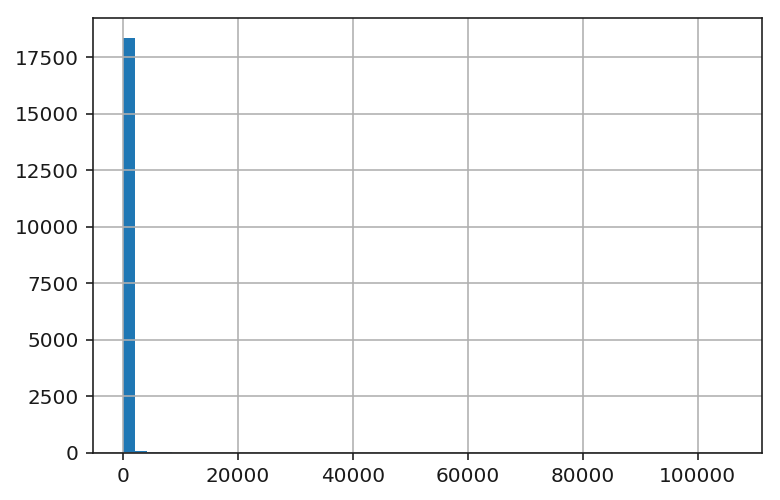

In [51]:
products_reviews.groupby('asin')['review_body'].count().sort_values(ascending=False).hist(bins=50)

Text(0.5,0,'Log of number of reviews')

Text(0,0.5,'Count')

Text(0.5,1,'Distribution of the number of reviews per product (log)')

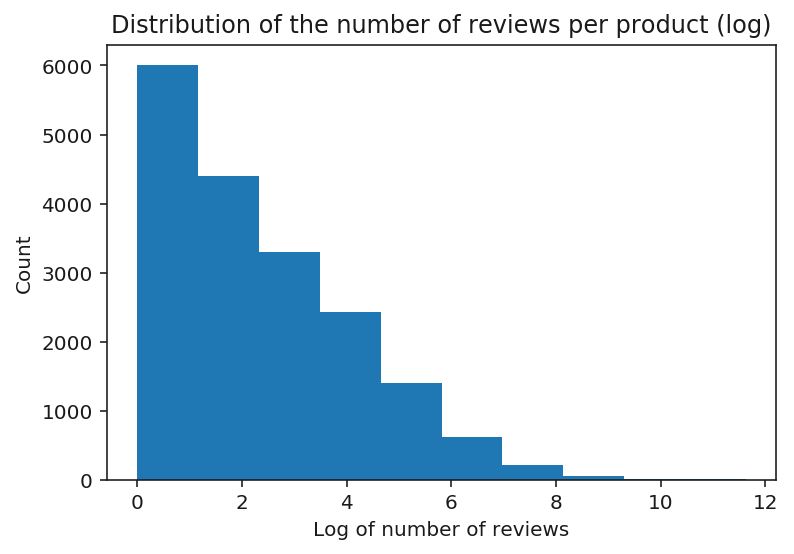

In [52]:
np.log(group_products['Number of reviews (Amazon.com)']+1).plot.hist()
plt.xlabel('Log of number of reviews')
plt.ylabel('Count')
plt.title('Distribution of the number of reviews per product (log)', fontsize=12)

In [ ]:
# Distribution of ratings
plt.hist(products_reviews.review_rating, bins=30)
plt.xlabel("Review rating")
plt.ylabel("Count of Reviews")
plt.title("Distribution of Reviews Ratings", fontsize=12)


#### Length of the review ~ review rating

In [ ]:
products_reviews['length_reviews']=products_reviews.review_body.str.len()

In [ ]:
products_reviews.length_reviews.head(5)

In [ ]:
# Length of reviews ~ rating

fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)

# Stripplot -Draw a scatterplot where one variable is categorical.
sns.stripplot(x=products_reviews.review_rating, y=products_reviews.length_reviews, jitter=True, size=1)

plt.xlabel("Review rating")
plt.ylabel("Review length")
plt.title("Review length per rating", fontsize=12)

# Conclusion: as expected some correlation between satisfaction and prolixity

### Company analysis

In [54]:
# Which companies were parsed
num_companies = len(products_reviews['company'].unique()) # number of companies
print("Number of companies parsed: ", num_companies)
products_reviews['company'].value_counts().head(10) # top 10 by # of reviews parsed

Number of companies parsed:  4668


Amazon        106437
TP-Link        84704
NETGEAR        83789
Sennheiser     63336
Panasonic      58967
Sony           51182
Roku           41638
ARRIS          37648
Beats          34763
Skullcandy     33956
Name: company, dtype: int64

Text(0.5,0,'Review rating')

Text(0,0.5,'Company average rating')

Text(0.5,1,'Distribution of Reviews Ratings by company')

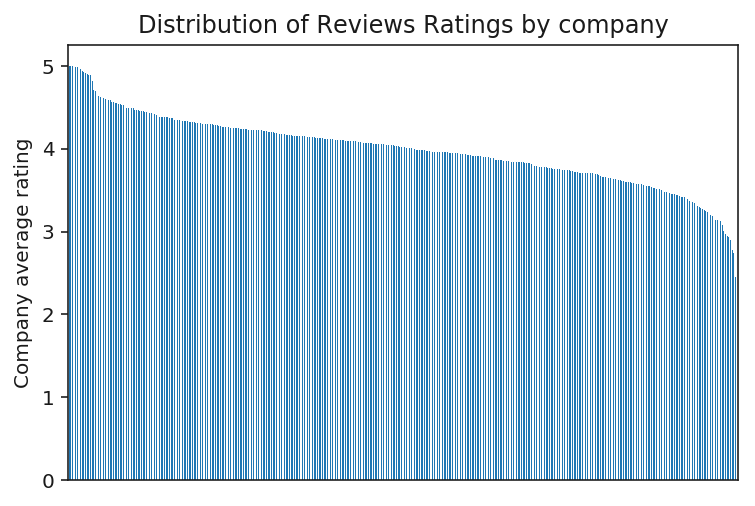

In [56]:
# Filter for companies with more than x reviews
top_companies = products_reviews.groupby('company').filter(lambda x: len(x) > 300)
# Plot rating per company

fig, ax = plt.subplots()
fig.set_size_inches(6, 4)
ax.xaxis.set_visible(False)

top_companies.groupby('company')['review_rating'].mean().sort_values(ascending=False).plot.bar()
plt.xlabel("Review rating")
plt.ylabel("Company average rating")
plt.title("Distribution of Reviews Ratings by company", fontsize=12)

In [57]:
pd.set_option('precision', 1)
# Filter for companies with more than x reviews
top_companies = products_reviews.groupby('company').filter(lambda x: len(x) > 20000)
top_companies_ratings = top_companies.groupby('company')['review_rating'].mean().sort_values(ascending=False)
top_companies_ratings = pd.DataFrame(top_companies_ratings).reset_index()
top_companies_ratings.head()


,company,review_rating
0,Amazon,4.5
1,Panasonic,4.3
2,Symphonized,4.2
3,ARRIS,4.2
4,Roku,4.2


[Text(0,0.5,'Company'), (3.25, 5), Text(0.5,0,'rating')]

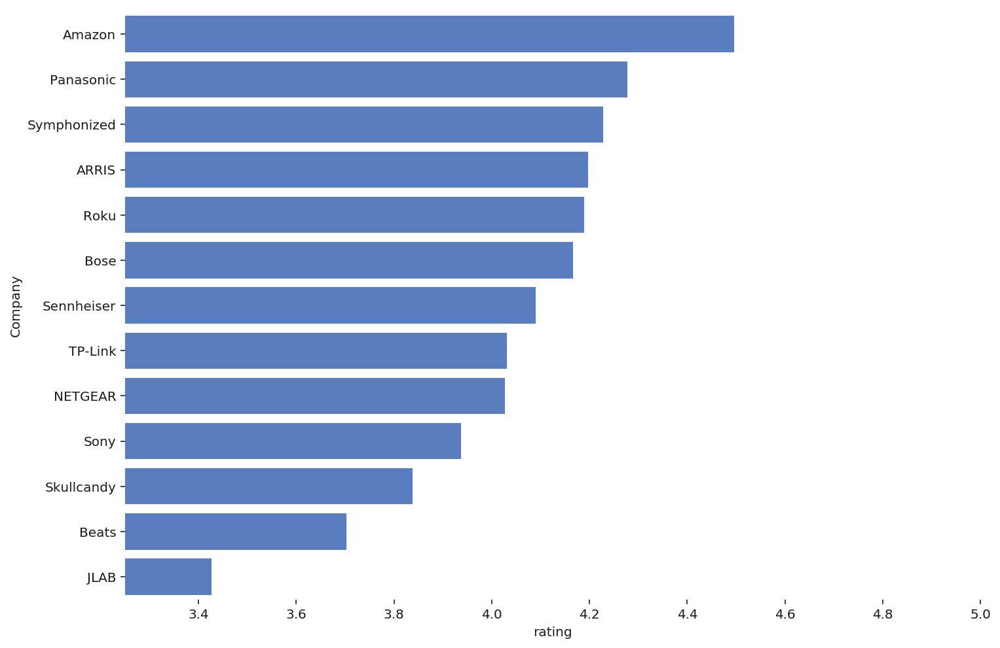

In [58]:
# Horizontal bar chart
f, ax = plt.subplots(figsize=(11.7, 8.27))

sns.set_color_codes("muted")
sns.barplot(x="review_rating", y="company", data=top_companies_ratings, color="b")

ax.set(xlim=(3.25, 5), ylabel="Company", xlabel="rating")
sns.despine(left=True, bottom=True)

#for patch in ax.patches :
        # we change the bar width
 #       patch.set_height(0.1)


#### Product ratings by company (boxplot)

In [60]:
# company_median_rating = company_group.rating.median().reset_index().sort_values('rating',ascending=False)
# company_median_rating=company_median_rating.set_index(['company'])
# company_median_rating

In [61]:
# company_group = company_group[company_median_rating.index]
# company_group.head()

Amazon             AxesSubplot(0.1,0.679412;0.363636x0.220588)
NETGEAR       AxesSubplot(0.536364,0.679412;0.363636x0.220588)
Panasonic          AxesSubplot(0.1,0.414706;0.363636x0.220588)
Sennheiser    AxesSubplot(0.536364,0.414706;0.363636x0.220588)
Sony                   AxesSubplot(0.1,0.15;0.363636x0.220588)
TP-Link           AxesSubplot(0.536364,0.15;0.363636x0.220588)
dtype: object

Text(0,0.5,'Test')

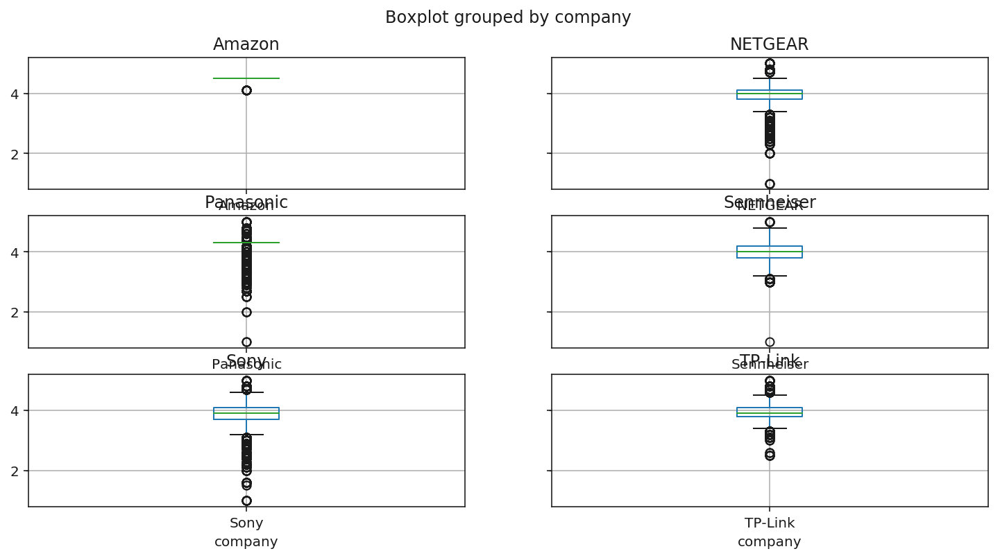

In [63]:
top_companies = products_reviews.groupby('company').filter(lambda x: len(x) > 50000)
company_group = top_companies.groupby(['company'])
company_group.boxplot(by='company', column='rating', figsize=(12,6)) # using rating so each data point is a product
plt.ylabel('Test')

### Zoom on Modems

In [64]:
top_companies = products_reviews.groupby('company').filter(lambda x: len(x) > 1000)
modems = top_companies[top_companies.category=='Modems'].groupby('company')['review_rating'].mean().sort_values(ascending=False)


Text(0.5,0,'Company')

Text(0,0.5,'Median rating')

Text(0.5,1,'Modem Companies Ratings')

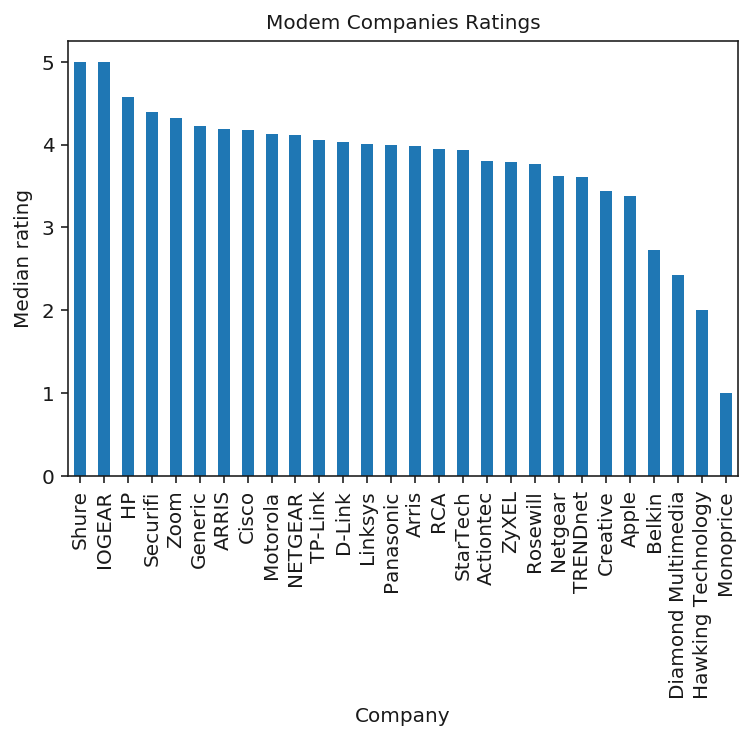

In [65]:
modems.plot.bar()
plt.xlabel('Company')
plt.ylabel('Median rating')
plt.title('Modem Companies Ratings', fontsize=10)
# TO DO - horizon bars so company name can be read



In [66]:
modems = pd.DataFrame(modems)
modems.head(10)
# US market is Arris/ Netgear and Zoom-Motorola:
# Zoom licenses motorola. It used to be Arr

,review_rating
company,
Shure,5.0
IOGEAR,5.0
HP,4.6
Securifi,4.4
Zoom,4.3
Generic,4.2
ARRIS,4.2
Cisco,4.2
Motorola,4.1


### Zoom on new generation cable modems (DOSCIS 3.1)

In [ ]:
docsis31_modems = set(products_reviews[products_reviews['product_desc'].str.contains(".*DOCSIS 3.1 .*", na=False)]['asin'])
docsis31_modems

In [ ]:
docsis31_modems_df = products_reviews[products_reviews['asin'].isin(['B01N6SKK1G', 'B0723599RQ', 'B01I5TJGSE', 'B01I8KA48G'])]
docsis31_modems_df.shape
docsis31_modems_df.groupby(['asin','product_desc']).size()

# Only the 3 main brands have models: Arris, Netgear (2) and Zoom Telephonics (licensing Motorola)

In [ ]:
# np.sum(docsis31_modems_df[(docsis31_modems_df.asin == 'B01I5TJGSE') & docsis31_modems_df.review_date <= "2017-09-25"])

In [ ]:
docsis31_modems_df.review_date.iloc[1]
docsis31_ts.date.iloc[1]
docsis31_modems_df.review_date.iloc[1] >= docsis31_ts.date.iloc[1]

### Reviews Time Series

In [ ]:
import datetime
start_date = datetime.datetime.today()
numdays = 365
dateList = []
for x in range (0, numdays):
    dateList.append(start_date - datetime.timedelta(days = x))
dates = sum([[i] * 4 for i in dateList[::-1]], []) # repeat dates for each of 4 products

In [ ]:
models = ['NETGEAR CM1000', 'NETGEAR Nighthawk X4S', 'ARRIS SURFboard SB8200', 'Motorola MB8600'] * 365
asin_list = ['B01I5TJGSE', 'B01I8KA48G', 'B01N6SKK1G', 'B0723599RQ'] * 365

In [ ]:
data = {'date': dates, 
        'asin': asin_list,
        'modem': models,
        'num_reviews_to_date': [0] * 4 * 365}  # initialize at 0
# docsis31_ts = pd.DataFrame(data, columns = ['Date', 'Model', 'Number of reviews'])
docsis31_ts = pd.DataFrame(data)

In [ ]:
docsis31_ts.shape
docsis31_ts.head()
docsis31_ts.dtypes

In [ ]:
# Calculate number of reviews per day
for (date, asin) in zip(docsis31_ts.date, docsis31_ts.asin):
    docsis31_ts.loc[(docsis31_ts.date == date) & 
                    (docsis31_ts.asin == asin),('num_reviews_to_date')] = docsis31_modems_df[(docsis31_modems_df.asin == asin) & 
                          (docsis31_modems_df.review_date <= date)].shape[0]

In [ ]:
# Plot Time Series

fig, ax = plt.subplots()
fig.set_size_inches(12, 9)

# this is to plot the kde
plt.plot(docsis31_ts.date[docsis31_ts.modem == "NETGEAR CM1000"], 
         docsis31_ts.num_reviews_to_date[docsis31_ts.modem == "NETGEAR CM1000"],
         label='NETGEAR CM1000');
plt.plot(docsis31_ts.date[docsis31_ts.modem == "NETGEAR Nighthawk X4S"], 
         docsis31_ts.num_reviews_to_date[docsis31_ts.modem == "NETGEAR Nighthawk X4S"],
         label='NETGEAR Nighthawk X4S');
plt.plot(docsis31_ts.date[docsis31_ts.modem == "ARRIS SURFboard SB8200"], 
         docsis31_ts.num_reviews_to_date[docsis31_ts.modem == "ARRIS SURFboard SB8200"],
         label='ARRIS SURFboard SB8200');
plt.plot(docsis31_ts.date[docsis31_ts.modem == "Motorola MB8600"], 
         docsis31_ts.num_reviews_to_date[docsis31_ts.modem == "Motorola MB8600"],
         label='Motorola MB8600');

plt.legend(['NETGEAR CM1000', 'NETGEAR Nighthawk X4S', 'ARRIS SURFboard SB8200', 'Motorola MB8600'], loc='upper left')
plt.xlabel('Date')
plt.ylabel('Review Count')
plt.show()
